# PRELUDE

Before starting this notebook, I want you to explore the examples of commercial SAR data in data/commercial_cog. There are a few examples. There are examples of Stripmap, Sliding Spotlight, and Spotlight modes. Pay attention to how the resolution of individual structures changes between the different modes.

**QUESTION (20 pts):**
The scene 

CAPELLA_C13_SP_GEO_HH_20250601220547_20250601220630_preview

shows the immediate aftermath (same day scene acquisition) of a Ukrainian drone attack on Belaya air base in central Russia on June 01 2025. This scene is a good example of what intact vs destroyed small structures look like in commercial SAR data. Intelligence agencies reported based on this scene that 3 large and 4 smaller aircraft were destroyed. Spend a few minutes looking through this scene, and print screen 2-3 examples of destroyed aircraft, and 2-3 examples of in-tack aircraft. Upload your examples as a separate pdf with a brief description of how you made this distinction. This type of analysis is common in both intelligence and disaster response applications, as structures destroyed by wildfire/earthquakes/hurricanes/etc. will show similar features, but those tend to be very messy scenes and difficult to interperet. 

**ANSWER: Upload examples along with this notebook.**

# Ship Detection in Commercial SAR Subsets

You have already explored commercial SAR scenes outside this notebook. Here you will process a prepared subset containing ships and build a simple brightness-based ship-candidate detector.

The detector identifies bright object candidates. It does not prove that an object is a ship.

This workflow is designed to get you familiar with the types of problems being addressed with commercial SAR data. There are 

## Learning objectives

By the end of this notebook, you should be able to load a SAR subset, display it, test brightness thresholds, group bright pixels into connected components, filter candidate objects, draw bounding boxes, and explain false positives.

In [2]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from scipy.ndimage import label, find_objects, binary_closing
from matplotlib.patches import Rectangle

## 2. Read one SAR subset

We are using a commercial SAR preview COG. Pixel values are 8-bit display brightness values. We will use them for visual interpretation and simple bright-target detection, not calibrated radiometric analysis.

In [3]:
#SCENE_INDEX = 0

path = r".\data\commercial_cog_subset\ship_subset.tiff" 

with rasterio.open(path) as src:
    arr = src.read(1)
    meta = {
        "width": src.width,
        "height": src.height,
        "count": src.count,
        "dtype": src.dtypes,
        "crs": src.crs,
        "resolution": src.res,
        "bounds": src.bounds,
        "nodata": src.nodata,
    }

print()
for k, v in meta.items():
    print(f"{k}: {v}")

print("Array shape:", arr.shape)
print("Array dtype:", arr.dtype)
print("Min/max:", np.nanmin(arr), np.nanmax(arr))

nodata = meta["nodata"] if meta["nodata"] is not None else 0
valid = np.isfinite(arr) & (arr != nodata)
print("Valid percentiles:", np.nanpercentile(arr[valid], [1, 50, 95, 99, 99.8, 99.9]))


width: 9381
height: 8141
count: 1
dtype: ('uint8',)
crs: EPSG:32618
resolution: (0.34999999999999054, 0.34999999999999054)
bounds: BoundingBox(left=579373.1451899222, bottom=4500843.217511419, right=582656.495189922, top=4503692.567511419)
nodata: 0.0
Array shape: (8141, 9381)
Array dtype: uint8
Min/max: 1 255
Valid percentiles: [  1.  22.  72.  85. 136. 158.]


## 3. Display the SAR subset

For Capella preview imagery, values may already be 8-bit display values. We use a percentile stretch and ignore nodata.

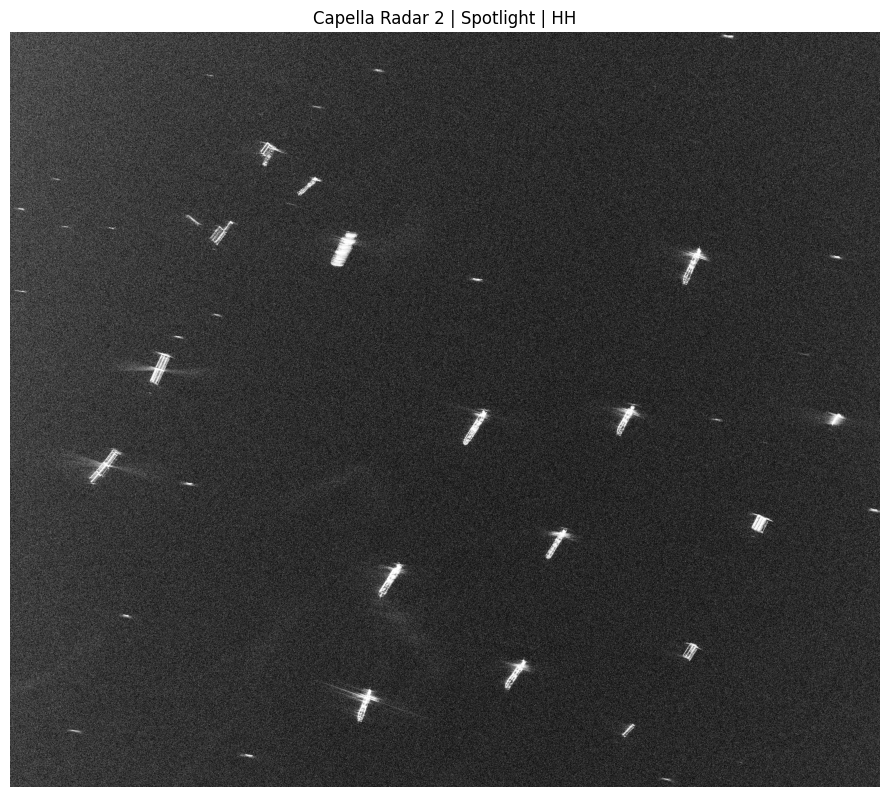

In [4]:
def display_sar(arr, pmin=1, pmax=99.8, nodata=0):
    img = arr.astype("float32").copy()
    if nodata is not None:
        img[img == nodata] = np.nan

    finite = np.isfinite(img)
    if not finite.any():
        return np.zeros_like(img, dtype="float32")

    lo, hi = np.nanpercentile(img[finite], [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)

def plot_sar(arr, title="", pmin=1, pmax=99.8, nodata=0, figsize=(9, 9)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    plt.figure(figsize=figsize)
    plt.imshow(disp, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

plot_sar(arr, title=f"Capella Radar 2 | Spotlight | HH", nodata=nodata)

### Questions

1. Identify several bright targets that are likely ships.
2. Do all ships appear as single blobs?
**QUESTION (5 pts):Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs? What might be some difficulty in designing a detector that can isolate single ships vs multiple clustered ships?**

**ANSWER:**
At high zoom levels, large ships no longer appear as a single solid mass. A ship may look like a cluster of slightly brighter spots separated from one another against the dark background of the water, likely due to strong radar wave reflections off metal vertical structures (such as masts).

Difficulties in designing the detector may arise due to segmentation methods (it is difficult to determine threshold values for merging pixels into a ship), which can lead to unnecessary fragmentation when an overly cautious detector, for the same reason, divides a single ship into several smaller ones.

## 4. Test brightness thresholds

A first simple detector is: `ship candidate pixel = brightness >= threshold`.

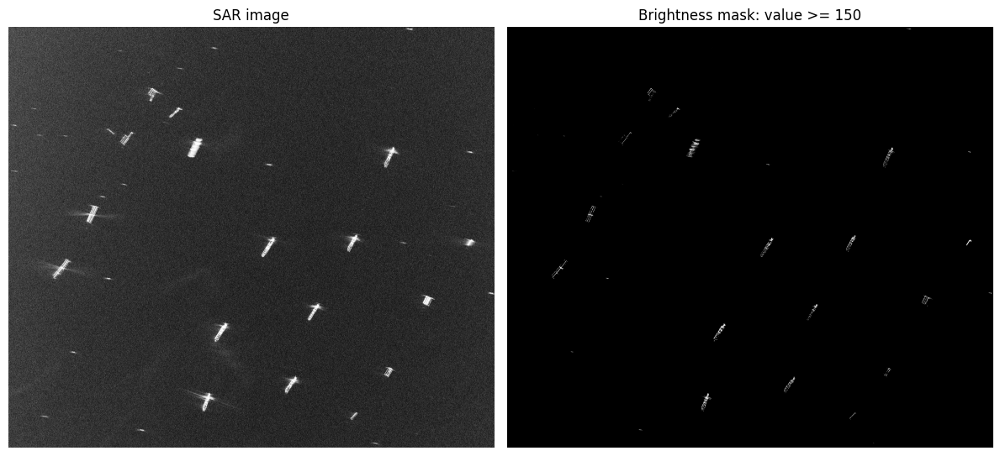

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428


In [5]:
def plot_threshold_mask(arr, threshold, nodata=0, pmin=1, pmax=99.8):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata
    mask = (img >= threshold) & valid

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata), cmap="gray")
    axes[0].set_title("SAR image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title(f"Brightness mask: value >= {threshold}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    print("Pixels above threshold:", int(mask.sum()))
    print("Fraction of valid pixels above threshold:", float(mask.sum() / valid.sum()))
    return mask

mask = plot_threshold_mask(arr, threshold=150, nodata=nodata)

The brightest ships show here, but this misses smaller ships. We will need a smaller threshold to capture as many ships as we can. Test a few different thresholds below. 


Threshold: 50


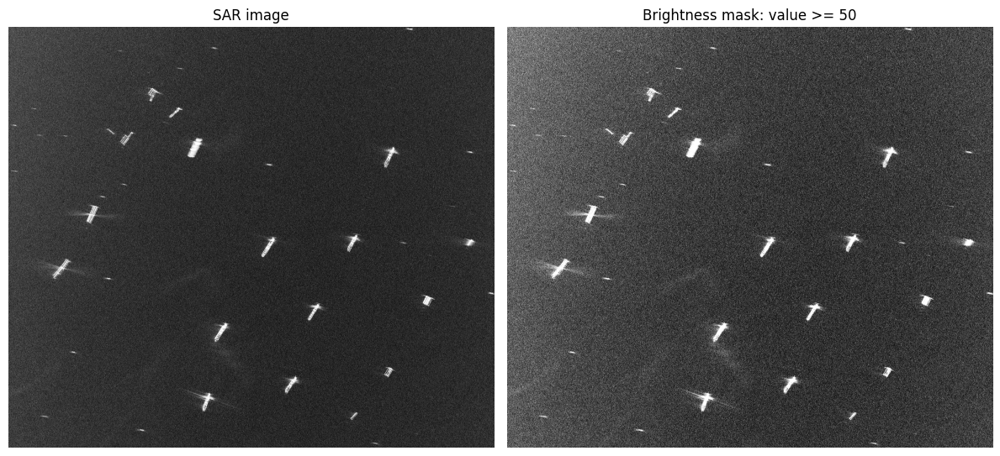

Pixels above threshold: 20156597
Fraction of valid pixels above threshold: 0.2639309507108097

Threshold: 100


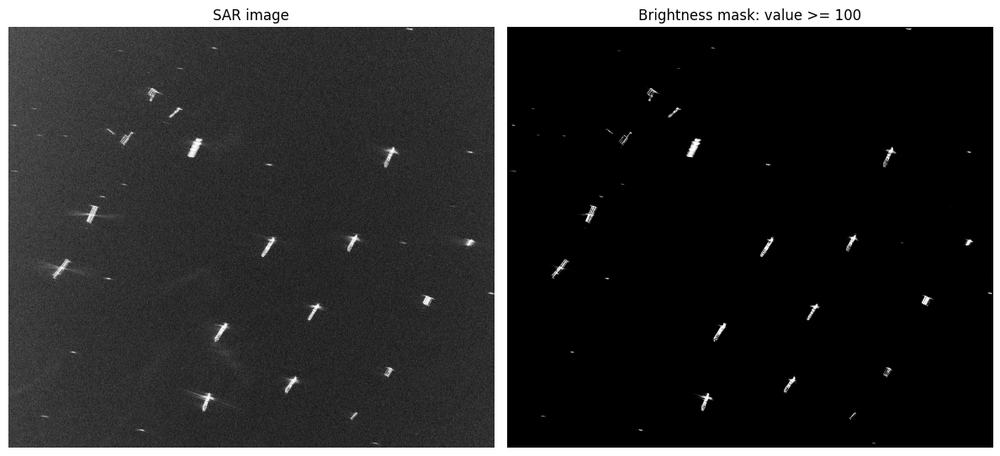

Pixels above threshold: 323454
Fraction of valid pixels above threshold: 0.004235314211581164

Threshold: 130


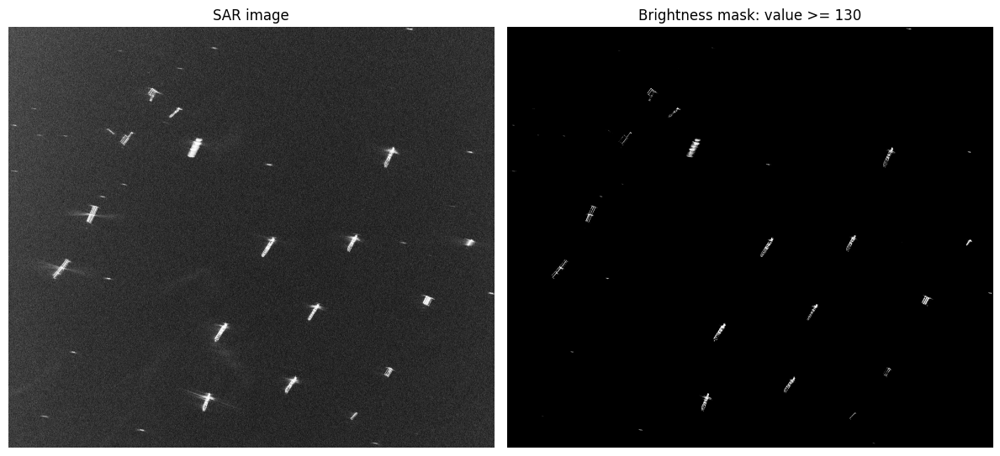

Pixels above threshold: 179626
Fraction of valid pixels above threshold: 0.0023520270287876424

Threshold: 150


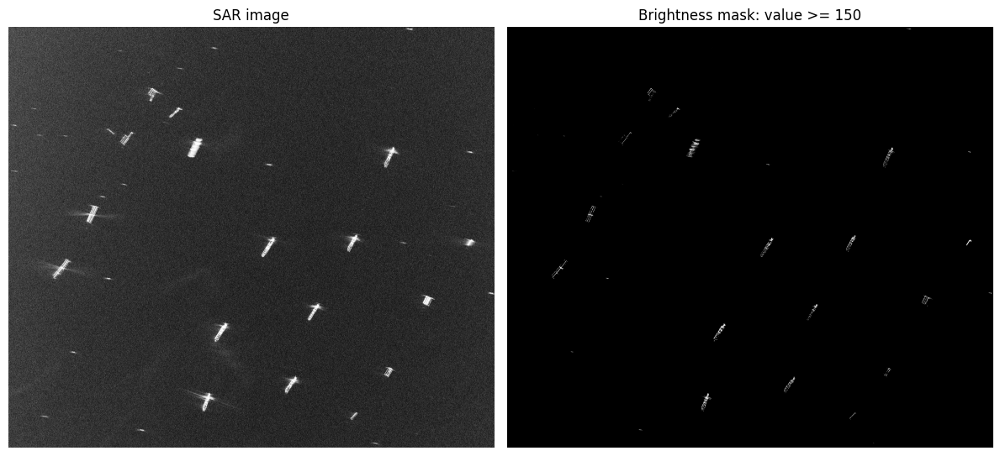

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428

Threshold: 170


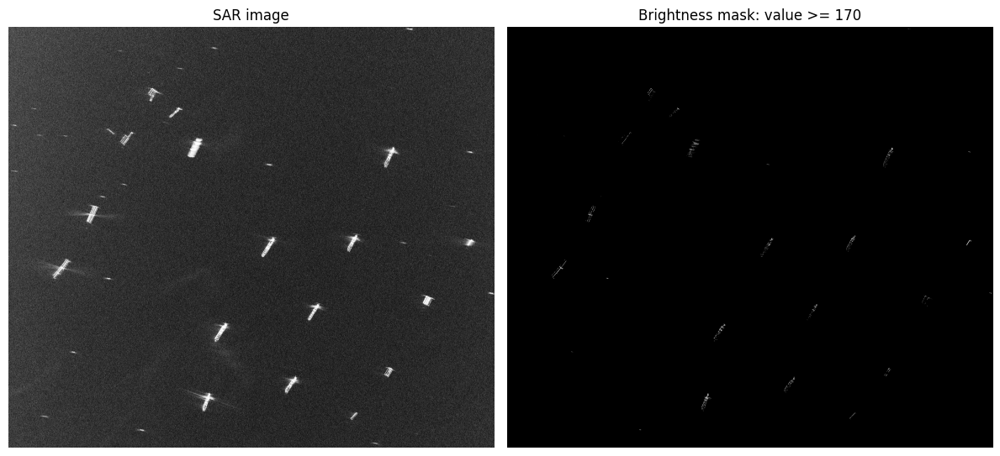

Pixels above threshold: 48056
Fraction of valid pixels above threshold: 0.0006292463835715261

Threshold: 200


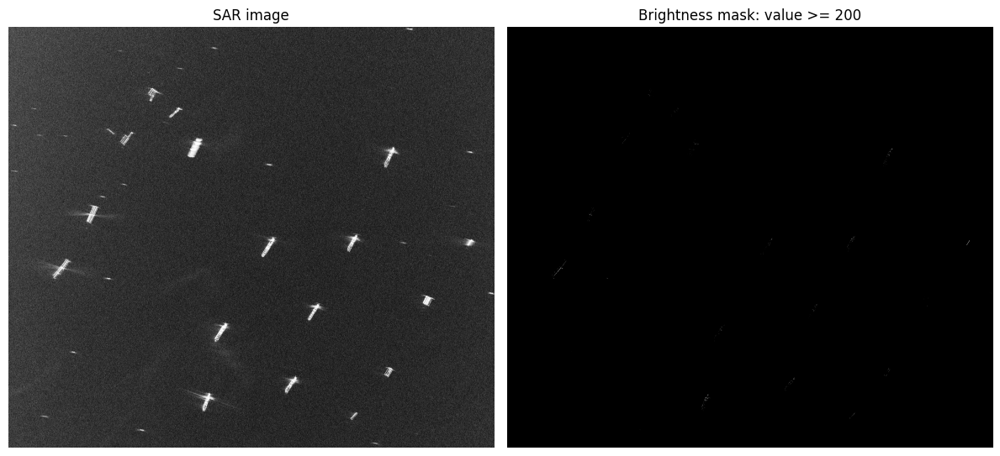

Pixels above threshold: 8667
Fraction of valid pixels above threshold: 0.00011348589991706376


In [6]:
###TRY SOME DIFFERENT THRESHOLDS HERE. PUT YOUR THRESHOLDS IN THE BRACKETS 50, 200 
for threshold in [50,100, 130, 150, 170, 200]:
    print("\nThreshold:", threshold)
    _ = plot_threshold_mask(arr, threshold=threshold, nodata=nodata)

**QUESTION (10 pts):**
1. **Which threshold seems too low?** Below 100 it is hard to recognize ships, because of amount of pollution.

2. **Which threshold seems too high?** With treshold above 170 smaller and some bigger ships seems like a random pixels.


3. **Which threshold would you choose for a first-pass detector?** Threshold around 100, as it balances capturing most ship candidates while keeping sea clutter low.

4. **What types of ships or ship parts might be missed by a high threshold?** Small vessels (like ooden fishing boats) and less reflective parts of large ships, such as open decks or bows, only capturing the highly reflective metal superstructures.

## 5. Connected components

The threshold mask marks bright pixels, not objects. Connected-component labeling groups adjacent bright pixels into candidate objects.

In [7]:
def connected_component_table(mask, arr):
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    img = arr.astype("float32")
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        area = int(component.sum())
        width = x1 - x0
        height = y1 - y0
        values = img[slc][component]
        rows.append({
            "object_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "width_pix": width, "height_pix": height, "area_pix": area,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    table = pd.DataFrame(rows)
    if len(table):
        table = table.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return table, labeled

threshold = 100
img = arr.astype("float32")
valid = np.isfinite(img) & (img != nodata)
mask = (img >= threshold) & valid
component_table, labeled = connected_component_table(mask, arr)
print("Number of connected components:", len(component_table))
display(component_table.head(20))

Number of connected components: 6795


,object_id,x0,y0,x1,y1,width_pix,height_pix,area_pix,mean_brightness,max_brightness
0,3421,4887,4084,5144,4457,257,373,22088,141.993073,255.0
1,6060,3738,7084,3965,7430,227,346,21975,148.802414,255.0
2,2754,1506,3460,1753,3802,247,342,20445,137.180634,255.0
3,4100,854,4527,1188,4862,334,335,18993,139.647873,255.0
4,1887,7254,2319,7497,2721,243,402,18730,145.751892,255.0
5,3338,6541,4032,6754,4344,213,312,17282,145.257782,255.0
6,3537,8842,4121,8992,4246,150,125,8066,140.005203,255.0
7,695,2700,1197,2922,1349,222,152,6500,143.544159,255.0
8,5752,5335,6768,5571,7075,236,307,16751,144.014740,252.0
9,4673,879,4869,914,4882,35,13,228,151.679825,251.0


**QUESTION (5 pts): Look at the number of connected components, printed before the table. Does that match with the approximate number of ships you think you should see? NOTE: The above and below cells only plot connected components and bounding boxes for a small subset of what was found. You can play with these values, but the image might get hard to read.**

**ANSWER:**
Number 6795 of connected components dont match the number of ships i was able to see. Visually, there are only about 17 actual ships visible in the subset.

The rows in the results table show the top 20 candidates for ships that the algorithm found in the entire image. This is close to my estimates; the additional entries may represent smaller objects or some reflected light.

## 6. Plot bounding boxes

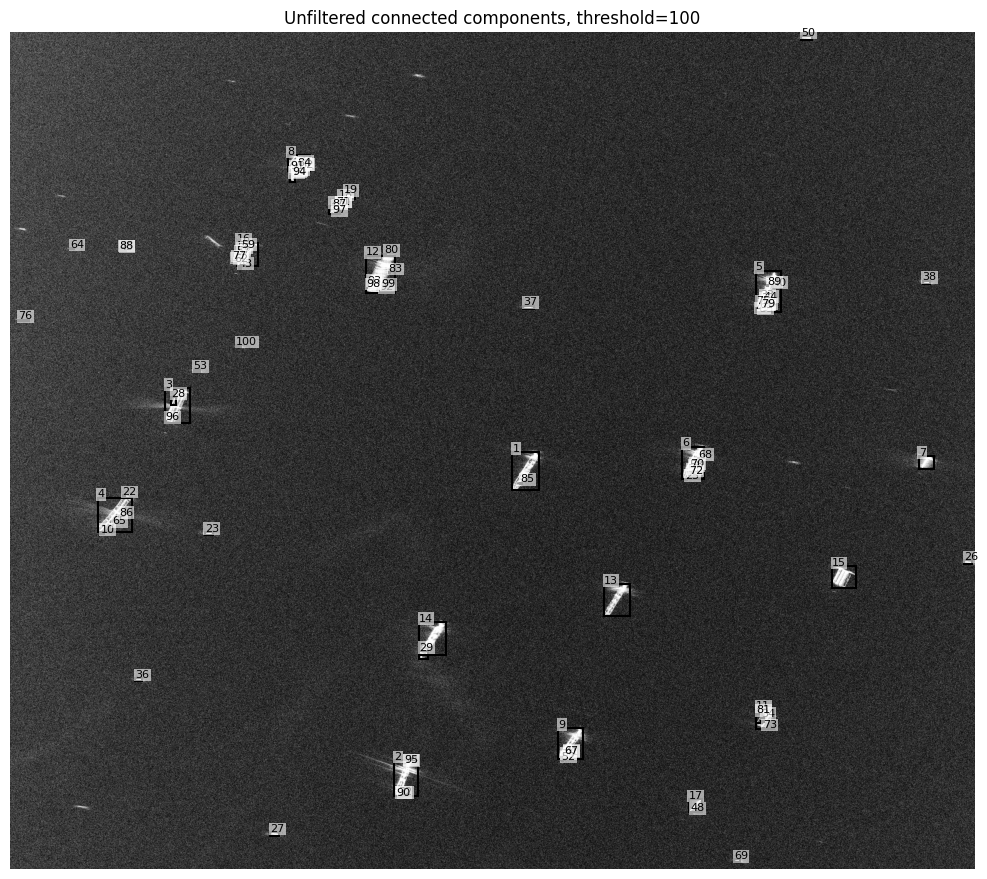

In [13]:
def plot_boxes(arr, candidates, title="Candidate boxes", nodata=0, pmin=1, pmax=99.8, max_boxes=100, label_boxes=True, figsize=(10, 10)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(disp, cmap="gray")
    ax.set_title(title)

    for i, (_, r) in enumerate(candidates.head(max_boxes).iterrows(), start=1):
        rect = Rectangle((r["x0"], r["y0"]), r["x1"] - r["x0"], r["y1"] - r["y0"], fill=False, linewidth=1.5)
        ax.add_patch(rect)
        if label_boxes:
            ax.text(r["x0"], max(r["y0"] - 3, 0), str(i), fontsize=8, bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1))

    ax.axis("off")
    plt.tight_layout()
    plt.show()

plot_boxes(arr, component_table.head(100), title=f"Unfiltered connected components, threshold={threshold}", nodata=nodata)

## 7. Precompiled reference detector

Use this to experiment with parameters before completing your own final detector.

In [14]:
def detect_ship_candidates_precompiled(arr, threshold=100, nodata=0, min_area=4, max_area=500, max_width=120, max_height=120, min_aspect=0.1, max_aspect=10.0, do_closing=True):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    mask = (img >= threshold) & valid
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        values = img[slc][component]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled

Detected candidates: 1284


,candidate_id,x0,y0,x1,y1,center_x,center_y,width_pix,height_pix,area_pix,aspect,mean_brightness,max_brightness
0,3767,879,4869,914,4882,896.5,4875.5,35,13,246,2.692308,146.544708,251.0
1,1995,7303,2618,7344,2684,7323.5,2651.0,41,66,473,0.621212,139.439743,215.0
2,3237,6570,4345,6585,4359,6577.5,4352.0,15,14,134,1.071429,147.029846,212.0
3,2036,7306,2671,7316,2678,7311.0,2674.5,10,7,46,1.428571,142.826080,208.0
4,5206,3777,7426,3795,7437,3786.0,7431.5,18,11,142,1.636364,144.887329,205.0
5,1982,7303,2590,7309,2599,7306.0,2594.5,6,9,35,0.666667,153.600006,205.0
6,4532,7305,6659,7337,6709,7321.0,6684.0,32,50,375,0.640000,133.664001,204.0
7,2077,7285,2724,7297,2733,7291.0,2728.5,12,9,83,1.333333,151.277115,197.0
8,4809,5390,7032,5404,7043,5397.0,7037.5,14,11,66,1.272727,141.515152,196.0
9,859,2765,1370,2790,1391,2777.5,1380.5,25,21,179,1.190476,134.290497,195.0


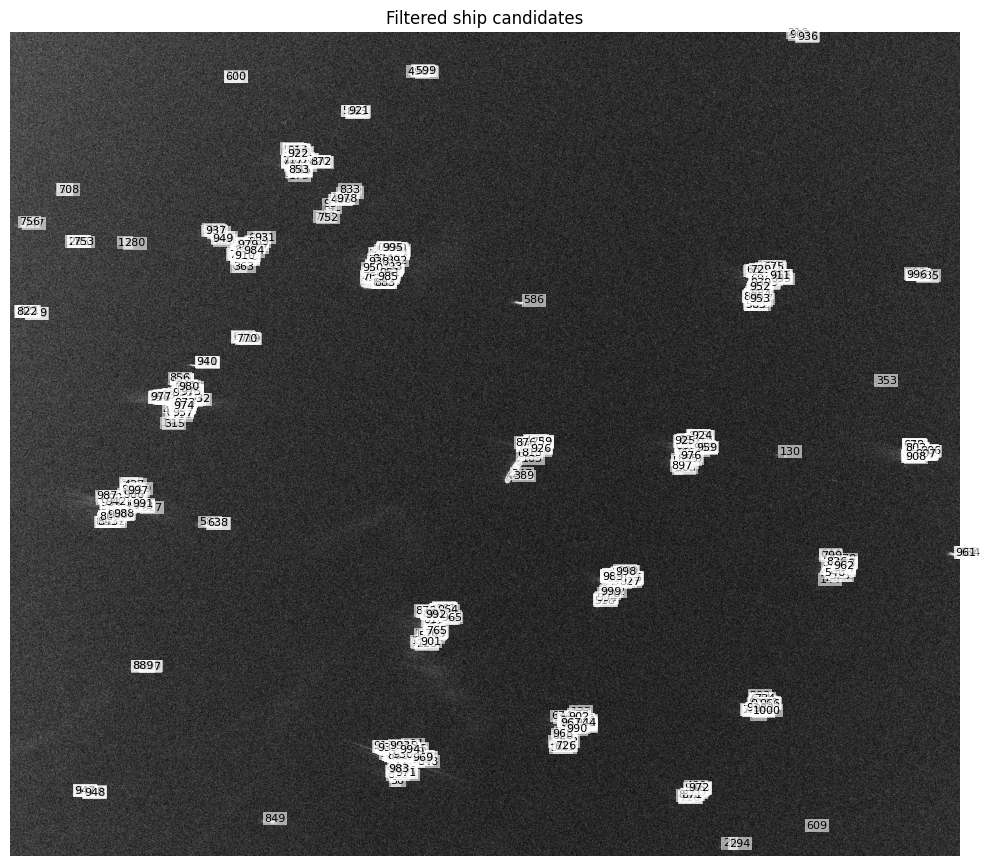

In [15]:
test_candidates, test_mask, test_labeled = detect_ship_candidates_precompiled(arr, threshold=100, nodata=nodata, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
print("Detected candidates:", len(test_candidates))
display(test_candidates.head(30))
plot_boxes(arr, test_candidates, title="Filtered ship candidates", nodata=nodata, max_boxes=1000)

The cell below will allow you to test a few different thresholds and areas at the same time. NOTE: If processing is too slow on your laptop, you can always take a smaller subset from QGIS for testing.


Settings: {'threshold': 100, 'min_area': 3, 'max_area': 800}
Candidate count: 1635


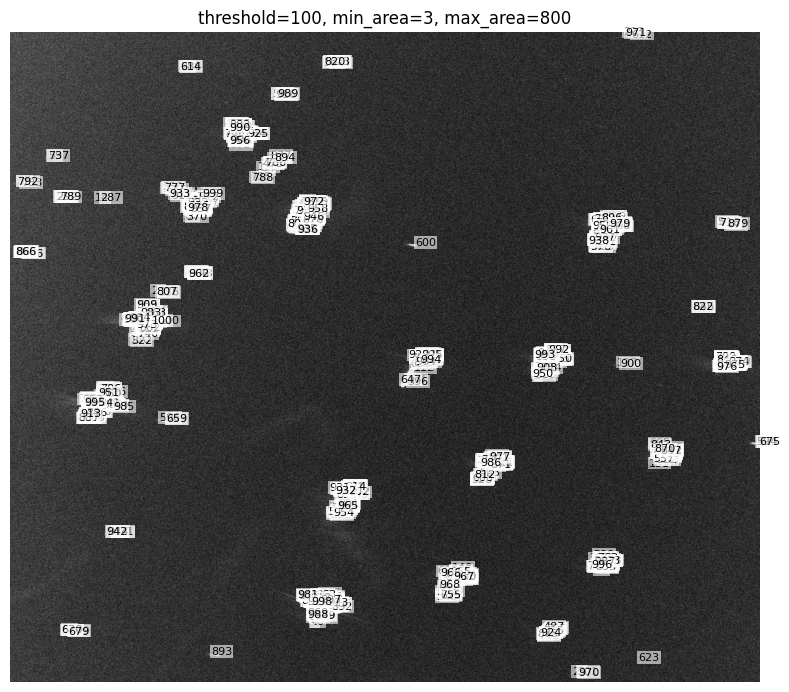


Settings: {'threshold': 100, 'min_area': 4, 'max_area': 500}
Candidate count: 1284


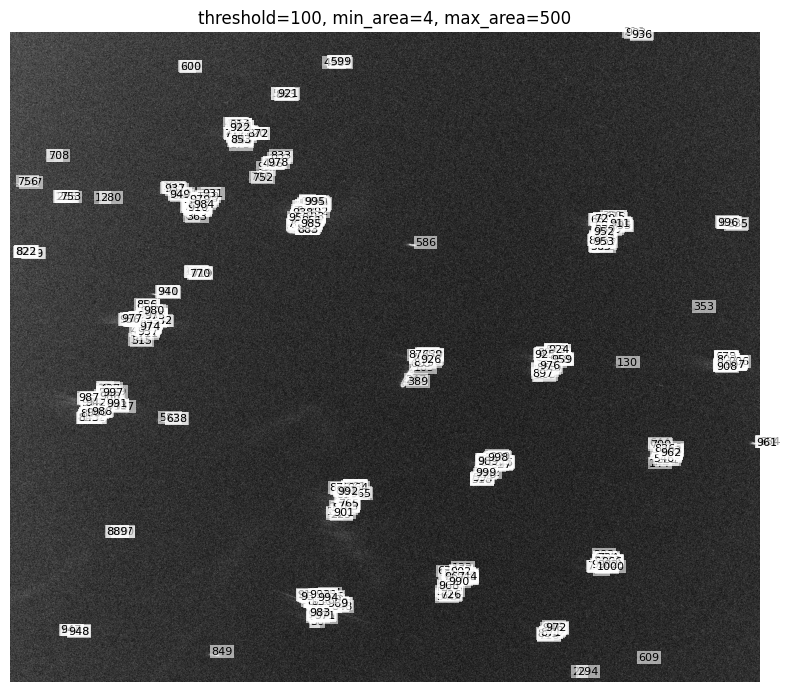


Settings: {'threshold': 80, 'min_area': 4, 'max_area': 500}
Candidate count: 65638


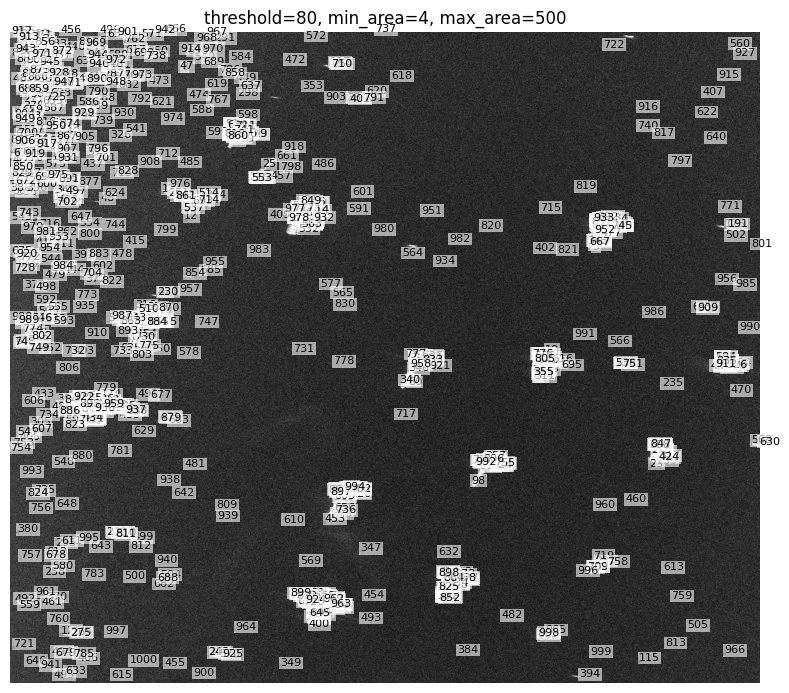


Settings: {'threshold': 130, 'min_area': 3, 'max_area': 300}
Candidate count: 1114


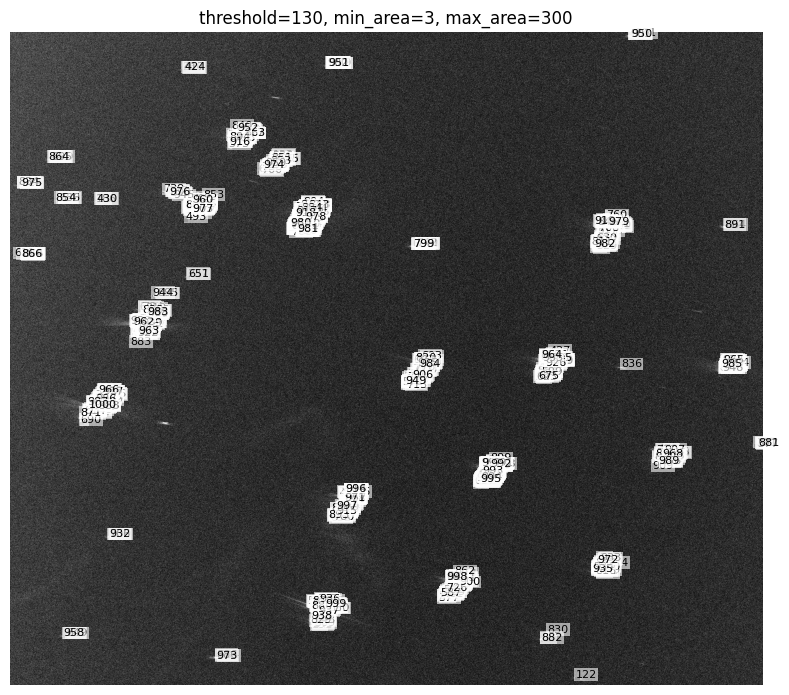


Settings: {'threshold': 70, 'min_area': 15, 'max_area': 600}
Candidate count: 23656


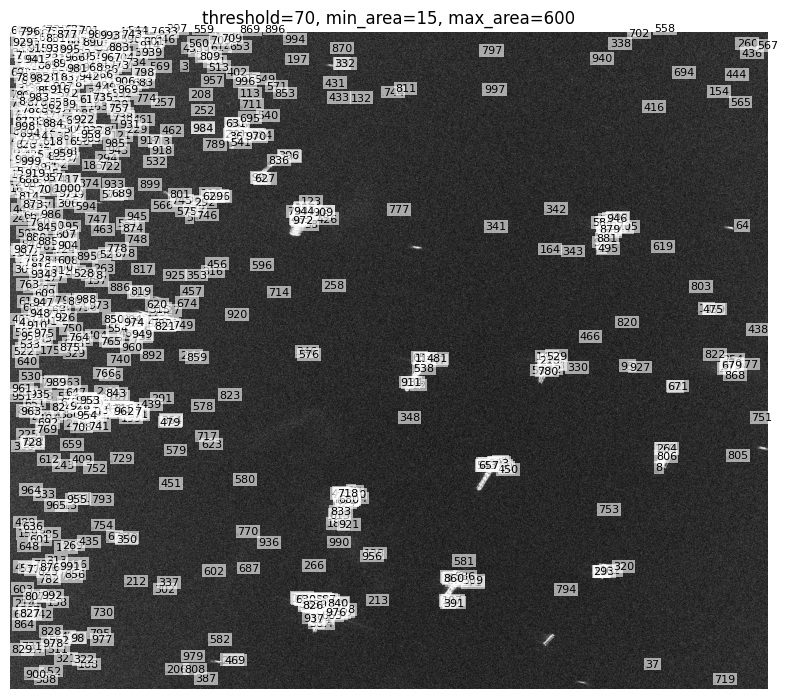


Settings: {'threshold': 160, 'min_area': 2, 'max_area': 200}
Candidate count: 1338


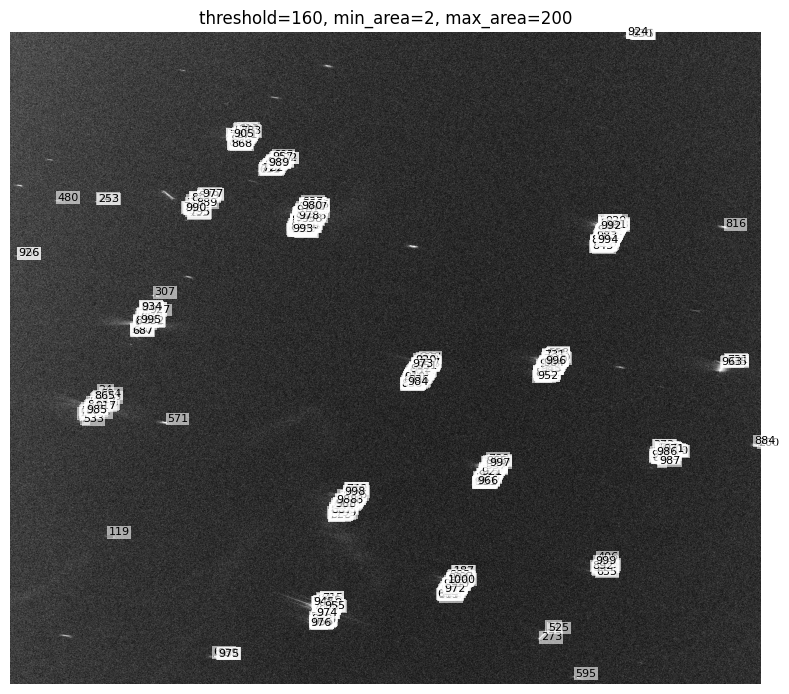

In [17]:
settings = [
    {"threshold": 100, "min_area": 3, "max_area": 800},
    {"threshold": 100, "min_area": 4, "max_area": 500},
    {"threshold": 80, "min_area": 4, "max_area": 500},
    
    {"threshold": 130, "min_area": 3, "max_area": 300},     #higher threshold (130) + smaller maximum area (300) -> focuses on the brightest, compact objects
    {"threshold": 70, "min_area": 15, "max_area": 600},     #lower threshold (70) + larger minimum area (15 pixels) -> allows detecting weaker reflections, but rejects noise    
    {"threshold": 160, "min_area": 2, "max_area": 200},     #very high threshold (160) + small objects (min_area: 2) -> focus on the cores of ships 

]

for s in settings:
    candidates, _, _ = detect_ship_candidates_precompiled(arr, nodata=nodata, max_width=120, max_height=120, do_closing=True, **s)
    print("\nSettings:", s)
    print("Candidate count:", len(candidates))
    plot_boxes(arr, candidates, title=f"threshold={s['threshold']}, min_area={s['min_area']}, max_area={s['max_area']}", nodata=nodata, max_boxes=1000, figsize=(8, 8))

**QUESTION (10 pts):**
1. **Which settings produce too many false positives?**
Most of the settings produced them, but settings with a low brightness threshold combined with a low minimum area (threshold=80, min_area=4) caused the algorithm to mistake sea clutter, large waves, and wake foam for ships, resulting in hundreds of false alerts across the open water.

2. **Which settings miss obvious ships?**
High brightness threshold (e.g 160) or too restrictive size filters (like max_area=200 or tight max width/height limits) cause smaller, less reflective vessels to disappear entirely, and can completely filter out exceptionally large ships that exceed the maximum size limits.

3. **Do larger ships split into multiple components?**
Yes, if the threshold is high and *do_closing=True* (morphological closing operation) isn't strong enough to bridge the gaps, a single large vessel will fragment into multiple distinct components, because the radar picks up isolated, highly reflective structures separated by darker, non-reflective deck spaces.



# 8. Final coding exercise — finish the ship detector

**QUESTION (30 pts):**
Adjust the detect_ship_candidates_precompiled() function above to group these candidate detections into individual ships. Right now, single ships are clusters of several to many different individual pieces - this is expected becasue SAR images of individual structures like boats are not uniformly illuminated, meaning there will often be gaps in bright spots. I found the scipy package binary_dilation to be very useful to add here. You will need to adjust the binary_closing if statement to first do binary_dilation, while also getting the structure correct with the merge_distance_pix variable. When compiling the summary statistics table at the end, it will be important to use the original bright pixels inside your grouped boxes to compute brightness, not the dilated pixels. The following code block will help with that:

        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid


In [ ]:
from scipy.ndimage import binary_dilation


def detect_ship_candidates_grouped(
    arr,
    threshold=100,
    nodata=0,
    min_area=4,
    max_area=50000,
    max_width=600,
    max_height=600,
    min_aspect=0.05,
    max_aspect=30.0,
    merge_distance_pix=15,
    do_closing=True,
):
###YOUR CODE HERE. COPY THE ORIGINAL detect_ship_candidates FUNCTION, AND ADJUST TO DO THE GROUPING
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    #base pixel mask based on the original thresholding (before morphological operations)
    base_mask = (img >= threshold) & valid
    mask = base_mask.copy()

    #grouping using binary dilation -> we expand the bright areas by merge_distance_pix pixels -> nearby bright spots will merge into one component
    if do_closing and merge_distance_pix > 0:
        structure = np.ones((merge_distance_pix, merge_distance_pix))
        mask = binary_dilation(mask, structure=structure)

    #labeling
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    #iteration over grouped objects
    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        
        rr, cc = slc
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        
        #sizes and aspect ratio of the bounding box of the grouped component
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        #calculatimng area based on the original px that were above the threshold (before dilation)
        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        
        original_bright = (original_component_pixels >= threshold) & original_valid # masking only those pixels inside the box that were really above the threshold before dilation
        
        #checking also if those original pixels belong to the outline of our grouped object     
        current_object_mask = labeled[y0:y1, x0:x1] == object_id
        final_pixel_mask = original_bright & current_object_mask

        area = int(final_pixel_mask.sum())
        if area < min_area or area > max_area:
            continue
        values = original_component_pixels[final_pixel_mask]
        
        if len(values) == 0:
            continue

        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    
    return candidates, base_mask, labeled

The following cells run and plot the above function.

candidate rows: 19
 candidate_id   x0   y0   x1   y1  center_x  center_y  width_pix  height_pix  area_pix   aspect  mean_brightness  max_brightness
         1103 1342 3441 1795 3829    1568.5    3635.0        453         388     24808 1.167526       133.612579           255.0
         1712 3477 7045 4024 7458    3750.5    7251.5        547         413     24291 1.324455       145.394882           255.0
         1254 4854 4054 5174 4466    5014.0    4260.0        320         412     23278 0.776699       140.608383           255.0
         1326  828 4483 1311 4892    1069.5    4687.5        483         409     22450 1.180929       136.049179           255.0
          861 7216 2307 7546 2752    7381.0    2529.5        330         445     21236 0.741573       142.924515           255.0
         1240 6511 4002 6799 4368    6655.0    4185.0        288         366     19068 0.786885       142.595612           255.0
          527 2649 1170 3003 1467    2826.0    1318.5        354         297  

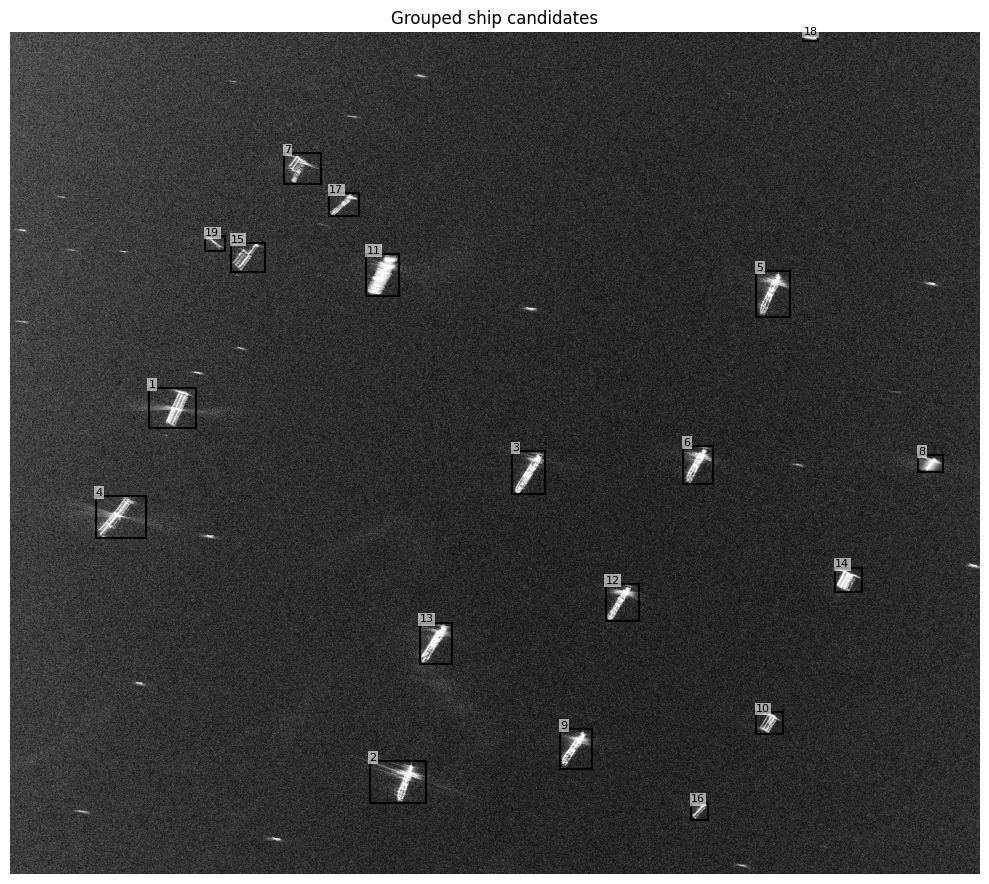

In [22]:
candidates, mask, labeled = detect_ship_candidates_grouped(
    arr,
    threshold=100,
    nodata=0,
    min_area=1500,
    max_area=70000,
    max_width=700,
    max_height=700,
    merge_distance_pix=20,
)
print("candidate rows:", len(candidates))
print(candidates.head(30).to_string(index=False))

plot_boxes(
    arr,
    candidates,
    title="Grouped ship candidates",
    nodata=0,
    max_boxes=1000,
)

## 9. Short interpretation note
**QUESTION (20 pts):**
Write 1 paragraph describing which parameters you settled on and why.

- Which threshold and size filters did you choose?
- Did your detector mostly find ships, or did it also detect clutter?
- What false positives remain? What false negatives remain?
- What types of ships might be missed?

**ANSWER:**
For the final detector configuration, I settled on a threshold=100 and a highly restrictive minimum size filter of min_area=1500 (with merge_distance_pix=20). These settings allowed the model to reach the exact expected count of 19 candidates, successfully isolating every visually identified vessel as a distinct object. Thanks to the large min_area threshold, the algorithm completely eliminated ambient sea clutter, leaving virtually no remaining false positives. However, the main trade-off of such a high area filter is the risk of false negatives; the detector will completely miss smaller vessels (such as fishing boats or yachts) that fail to meet the substantial 1,500-pixel size requirement.



## Optional extension

Run the same detector on another subset, such as a Sliding Spotlight or Stripmap scene. Do the same thresholds work? Which mode makes ship detection easiest?

In [ ]:
# OPTIONAL: try another scene from the manifest.

# SCENE_INDEX = 1
# row = df.iloc[SCENE_INDEX]
# path = ROOT / row["local_path"]
#
# with rasterio.open(path) as src:
#     arr2 = src.read(1)
#     nodata2 = src.nodata if src.nodata is not None else 0
#
# plot_sar(arr2, title=f"{row['scene_id']} | {row['mode']} | {row['polarization']}", nodata=nodata2)
#
# candidates2, mask2, labeled2 = detect_ship_candidates(arr2, threshold=210, nodata=nodata2, min_area=4, max_area=500, max_width=120, max_height=120, do_closing=True)
# print("Detected candidates:", len(candidates2))
# display(candidates2.head(30))
# plot_boxes(arr2, candidates2, title="Optional second-scene detections", nodata=nodata2)